# 3.x Emerging Markets Analysis
## Which Spanish provinces should Iberdrola prioritise for EV charging rollout?

**Methodology**
1. Compute 2-year CAGR (2021-2023) per province from DGT registration data
2. Quadrant analysis: fleet size vs growth rate
3. Opportunity score: CAGR (40%) + Fleet 2027 (35%) + Infrastructure gap (25%)
4. Validate with external proxies: GDP, ANFAC sales, ICCT charger density


In [5]:
import warnings, os, sys
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
import requests

print('Imports OK')


Imports OK


## 1. Constants & Configuration

In [6]:
NOTEBOOK_DIR = os.path.dirname(os.path.abspath('__file__'))
OUTPUTS_DIR  = os.path.join(NOTEBOOK_DIR, 'outputs')
PROVINCE_CSV = os.path.join(OUTPUTS_DIR, 'province_demand_2027.csv')
DGT_CSV_DIR  = os.path.join(os.path.dirname(NOTEBOOK_DIR),
                             'mobility_electric_routes', 'Codigo', 'Data', 'csv')

CAGR_BASE = 2021
CAGR_END  = 2023
MIN_BASE  = 50

Q_COLORS = {
    'Leader':   '#2E86AB',
    'Emerging': '#E84855',
    'Mature':   '#F6AE2D',
    'Lagging':  '#AAAAAA',
}

# Source: ANFAC 2024 EV market report
ANFAC_2024 = {
    'Comunidad de Madrid': 0.32, 'Cataluna': 0.19,
    'Comunidad Valenciana': 0.09, 'Andalucia': 0.07,
    'Pais Vasco': 0.06, 'Aragon': 0.03,
    'Castilla y Leon': 0.04, 'Castilla-La Mancha': 0.02,
    'Murcia': 0.02, 'Navarra': 0.02, 'Galicia': 0.03,
    'Canarias': 0.03, 'Baleares': 0.02, 'Extremadura': 0.01,
    'Cantabria': 0.01, 'Asturias': 0.01, 'La Rioja': 0.01,
}

# Source: INE 2023 Regional GDP per capita (EUR)
INE_GDP = {
    'Comunidad de Madrid': 38700, 'Pais Vasco': 36200,
    'Navarra': 34100, 'Cataluna': 32500, 'Aragon': 29800,
    'Cantabria': 27100, 'Baleares': 30200, 'La Rioja': 28600,
    'Castilla y Leon': 26800, 'Comunidad Valenciana': 24900,
    'Asturias': 24200, 'Canarias': 22100, 'Galicia': 24500,
    'Murcia': 22400, 'Andalucia': 20500,
    'Castilla-La Mancha': 21200, 'Extremadura': 17900,
}

# Source: ICCT 2023 chargers per 100 EVs (lower = bigger gap)
ICCT_CHARGERS = {
    'Comunidad de Madrid': 8.2, 'Cataluna': 7.1,
    'Comunidad Valenciana': 5.9, 'Andalucia': 4.1,
    'Pais Vasco': 9.3, 'Aragon': 6.8,
    'Castilla y Leon': 5.5, 'Castilla-La Mancha': 3.9,
    'Murcia': 4.5, 'Navarra': 10.2, 'Galicia': 5.1,
    'Canarias': 7.8, 'Baleares': 11.5, 'Extremadura': 3.2,
    'Cantabria': 8.9, 'Asturias': 6.4, 'La Rioja': 9.7,
}

print('Constants loaded.')


Constants loaded.


## 2. Load Province Demand Data (from 2.2 output)

In [7]:
prov = pd.read_csv(PROVINCE_CSV)
print(f'Loaded {len(prov)} provinces')
prov.head(3)


Loaded 52 provinces


,province_code,province_name,ine_code,auto_community,total_2021_2023,share_pct,ev_fleet_2027,rank,bev_share_pct
0,M,Madrid,28,Comunidad de Madrid,147312,44.9963,635635,1,42.54
1,B,Barcelona,8,Cataluña,42745,13.0564,184440,2,61.84
2,V,Valencia/València,46,Comunitat Valenciana,13048,3.9855,56301,3,58.93


## 3. Load DGT Registrations (2021-2023) for CAGR

In [8]:
# DGT files are monthly CSVs (e.g. 2021_01.csv ... 2021_12.csv), comma-separated.
# EV type is in column CATEGORIA_VEHICULO_ELECTRICO (latin1 accented name).
EV_TYPES = {'BEV', 'PHEV', 'REEV', 'FCEV'}

yearly = {}
for yr in [2021, 2022, 2023]:
    # Collect ALL monthly files for this year
    matches = sorted([f for f in os.listdir(DGT_CSV_DIR)
                      if f.startswith(str(yr)) and f.endswith('.csv')])
    if not matches:
        print(f'WARNING: no CSV found for {yr}')
        continue

    yr_counts = {}
    for fname in matches:
        fpath = os.path.join(DGT_CSV_DIR, fname)
        try:
            df = pd.read_csv(fpath, sep=',', encoding='latin1',
                             low_memory=False, on_bad_lines='skip')
        except Exception as e:
            print(f'  {fname}: read error {e}')
            continue
        df.columns = df.columns.str.strip().str.upper()

        # EV category column has accented chars in latin1 -- match on ASCII substring
        type_col = next((c for c in df.columns if 'CATEG' in c and 'EL' in c), None)
        prov_col = next((c for c in df.columns if c == 'COD_PROVINCIA_VEH'), None)
        if prov_col is None:
            prov_col = next((c for c in df.columns if 'PROVINCIA' in c and 'VEH' in c), None)

        if type_col and prov_col:
            ev_mask = df[type_col].str.upper().isin(EV_TYPES)
            for pcode, cnt in df.loc[ev_mask, prov_col].value_counts().items():
                yr_counts[pcode] = yr_counts.get(pcode, 0) + cnt
        else:
            print(f'  {fname}: cols not found -- type_col={type_col}, prov_col={prov_col}')

    if yr_counts:
        yearly[yr] = pd.Series(yr_counts)
        print(f'{yr}: {len(matches)} files -> {sum(yr_counts.values()):,} EV registrations')
    else:
        print(f'{yr}: no EV data found')

if not yearly:
    print('ERROR: no DGT data loaded. Check DGT_CSV_DIR path.')
else:
    reg_df = pd.DataFrame(yearly).fillna(0).astype(int)
    reg_df.index.name = 'province_code'
    print(f'\nRegistrations matrix: {reg_df.shape}')
    print(reg_df.nlargest(5, 2023))


2021: 12 files -> 83,190 EV registrations
2022: 12 files -> 99,795 EV registrations
2023: 12 files -> 142,354 EV registrations

Registrations matrix: (51, 3)
                2021   2022   2023
province_code                     
M              38243  41924  66976
B              11367  15313  16140
V               3122   4008   5942
A               2626   3214   4731
IB              1910   2393   3484


## 4. Compute 2-year CAGR (2021 to 2023)

CAGR = (Reg_2023 / Reg_2021)^(1/2) - 1

Provinces with fewer than `MIN_BASE` registrations in 2021 are excluded to avoid outlier CAGRs.


In [9]:
cagr_rows = []
for pcode, row in reg_df.iterrows():
    base_val = row.get(CAGR_BASE, 0)
    end_val  = row.get(CAGR_END,  0)
    if base_val < MIN_BASE:
        continue
    cagr = (end_val / base_val) ** (1 / (CAGR_END - CAGR_BASE)) - 1
    cagr_rows.append({'province_code': pcode, 'reg_base': base_val,
                      'reg_end': end_val, 'cagr': cagr})

cagr_df = pd.DataFrame(cagr_rows)

analysis = prov.merge(cagr_df, on='province_code', how='left')
analysis['cagr'] = analysis['cagr'].fillna(0)

national_cagr         = cagr_df['cagr'].mean()
national_fleet_median = analysis['ev_fleet_2027'].median()

print(f'National average CAGR: {national_cagr:.1%}')
print(f'National fleet 2027 median: {national_fleet_median:,.0f}')
print(f'Provinces with CAGR computed: {cagr_df.shape[0]}')
analysis[['province_code','province_name','ev_fleet_2027','cagr']].sort_values('cagr', ascending=False).head(10)


National average CAGR: 30.3%
National fleet 2027 median: 7,870
Provinces with CAGR computed: 50


,province_code,province_name,ev_fleet_2027,cagr
8,BI,Bizkaia,22951,0.557713
34,LO,La Rioja,4789,0.507827
30,BA,Badajoz,6045,0.498074
29,AB,Albacete,6511,0.469434
6,MA,Málaga,31745,0.407088
14,Z,Zaragoza,17359,0.397591
10,TO,Toledo,22441,0.388417
7,TF,Santa Cruz de Tenerife,23926,0.385023
32,LE,León,5135,0.380629
2,V,Valencia/València,56301,0.379589


## 5. Quadrant Classification

| Quadrant | Fleet | Growth | Interpretation |
|----------|-------|--------|----------------|
| **Leader**   | High  | High   | Already strong -- defend and grow |
| **Emerging** | Low   | High   | Fast-growing markets -- **top priority for Iberdrola** |
| **Mature**   | High  | Low    | Large fleet, slowing growth -- optimise existing infra |
| **Lagging**  | Low   | Low    | Low priority / niche rural |


In [10]:
def classify_quadrant(row, fleet_threshold, cagr_threshold):
    high_fleet  = row['ev_fleet_2027'] >= fleet_threshold
    high_growth = row['cagr']          >= cagr_threshold
    if   high_fleet and     high_growth: return 'Leader'
    elif not high_fleet and high_growth: return 'Emerging'
    elif high_fleet and not high_growth: return 'Mature'
    else:                                return 'Lagging'

analysis['quadrant'] = analysis.apply(
    classify_quadrant,
    fleet_threshold=national_fleet_median,
    cagr_threshold=national_cagr,
    axis=1
)

print(analysis['quadrant'].value_counts())
analysis[['province_code','province_name','ev_fleet_2027','cagr','quadrant']].sort_values(['quadrant','cagr'], ascending=[True, False]).head(20)


quadrant
Lagging     16
Leader      15
Mature      11
Emerging    10
Name: count, dtype: int64


,province_code,province_name,ev_fleet_2027,cagr,quadrant
34,LO,La Rioja,4789,0.507827,Emerging
30,BA,Badajoz,6045,0.498074,Emerging
29,AB,Albacete,6511,0.469434,Emerging
32,LE,León,5135,0.380629,Emerging
35,GU,Guadalajara,4730,0.366353,Emerging
37,CR,Ciudad Real,4306,0.366260,Emerging
47,ZA,Zamora,1420,0.360828,Emerging
43,CU,Cuenca,2071,0.353462,Emerging
33,LU,Lugo,4833,0.319091,Emerging
39,SA,Salamanca,4043,0.311805,Emerging


## 6. Quadrant Scatter Plot

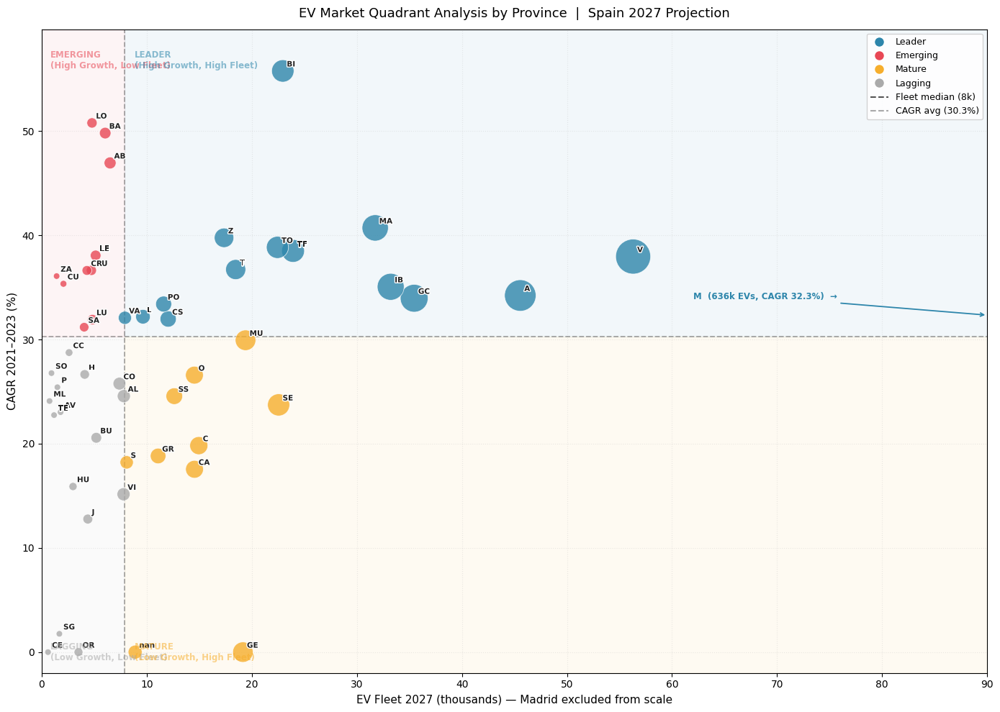

Saved: c:\Users\steve\OneDrive - IE University\Term 2\DATATHON_2\Iberdrola\SpanishElecticGrid\notebooks\outputs\emerging_markets_quadrant.png


In [12]:
import matplotlib.patheffects as pe

fig, ax = plt.subplots(figsize=(14, 10))

# ── Quadrant background shading ────────────────────────────────────────────
X_MAX_PLOT = 90     # crop axis here; Madrid annotated separately
Y_MIN = analysis['cagr'].min() * 100 - 2
Y_MAX = analysis['cagr'].max() * 100 + 4

ax.axvspan(0, national_fleet_median / 1000,
           ymin=(national_cagr * 100 - Y_MIN) / (Y_MAX - Y_MIN),
           ymax=1, alpha=0.06, color=Q_COLORS['Emerging'], zorder=0)
ax.axvspan(national_fleet_median / 1000, X_MAX_PLOT,
           ymin=(national_cagr * 100 - Y_MIN) / (Y_MAX - Y_MIN),
           ymax=1, alpha=0.06, color=Q_COLORS['Leader'], zorder=0)
ax.axvspan(0, national_fleet_median / 1000,
           ymin=0,
           ymax=(national_cagr * 100 - Y_MIN) / (Y_MAX - Y_MIN),
           alpha=0.06, color=Q_COLORS['Lagging'], zorder=0)
ax.axvspan(national_fleet_median / 1000, X_MAX_PLOT,
           ymin=0,
           ymax=(national_cagr * 100 - Y_MIN) / (Y_MAX - Y_MIN),
           alpha=0.06, color=Q_COLORS['Mature'], zorder=0)

# ── Threshold lines ────────────────────────────────────────────────────────
ax.axvline(national_fleet_median / 1000, ls='--', lw=1.3, color='#555', alpha=0.5,
           label=f'Fleet median ({national_fleet_median/1000:.0f}k EVs)')
ax.axhline(national_cagr * 100, ls='--', lw=1.3, color='#555', alpha=0.5,
           label=f'National CAGR avg ({national_cagr:.1%})')

# ── Plot points (exclude Madrid from main axes — it breaks the scale) ──────
OUTLIERS = {'M'}   # provinces to annotate separately
plot_df  = analysis[~analysis['province_code'].isin(OUTLIERS)].copy()
out_df_o = analysis[analysis['province_code'].isin(OUTLIERS)].copy()

# Bubble size = fleet 2027 (scaled)
size_scale = 4000 / plot_df['ev_fleet_2027'].max()

for quad, grp in plot_df.groupby('quadrant'):
    sizes = (grp['ev_fleet_2027'] * size_scale).clip(lower=40)
    ax.scatter(grp['ev_fleet_2027'] / 1000, grp['cagr'] * 100,
               c=Q_COLORS[quad], s=sizes, alpha=0.80, label=quad,
               edgecolors='white', linewidths=0.6, zorder=3)

# ── Province labels ────────────────────────────────────────────────────────
for _, row in plot_df.iterrows():
    x = row['ev_fleet_2027'] / 1000
    y = row['cagr'] * 100
    ax.annotate(
        row['province_code'],
        (x, y),
        fontsize=7.5, fontweight='bold', color='#222',
        ha='left', va='bottom',
        xytext=(4, 3), textcoords='offset points',
        path_effects=[pe.withStroke(linewidth=2, foreground='white')]
    )

# ── Madrid off-axis annotation ─────────────────────────────────────────────
for _, row in out_df_o.iterrows():
    fleet_k = row['ev_fleet_2027'] / 1000
    ax.annotate(
        f"M  ({fleet_k:.0f}k EVs, CAGR {row['cagr']:.1%})  →",
        xy=(X_MAX_PLOT, row['cagr'] * 100),
        xytext=(X_MAX_PLOT - 28, row['cagr'] * 100 + 1.5),
        fontsize=8.5, color=Q_COLORS['Leader'], fontweight='bold',
        arrowprops=dict(arrowstyle='->', color=Q_COLORS['Leader'], lw=1.3),
    )

# ── Quadrant corner labels ─────────────────────────────────────────────────
label_y_top = Y_MAX - 2
label_y_bot = Y_MIN + 1
label_x_left  = 0.8
label_x_right = national_fleet_median / 1000 + 1

for txt, x, y, col in [
    ('EMERGING\n(High Growth, Low Fleet)',  label_x_left,  label_y_top, Q_COLORS['Emerging']),
    ('LEADER\n(High Growth, High Fleet)',   label_x_right, label_y_top, Q_COLORS['Leader']),
    ('LAGGING\n(Low Growth, Low Fleet)',    label_x_left,  label_y_bot, Q_COLORS['Lagging']),
    ('MATURE\n(Low Growth, High Fleet)',    label_x_right, label_y_bot, Q_COLORS['Mature']),
]:
    ax.text(x, y, txt, color=col, fontsize=8.5, fontweight='bold', alpha=0.55,
            va='top' if y == label_y_top else 'bottom')

# ── Axes & formatting ──────────────────────────────────────────────────────
ax.set_xlim(0, X_MAX_PLOT)
ax.set_ylim(Y_MIN, Y_MAX)
ax.set_xlabel('EV Fleet 2027 (thousands) — Madrid excluded from scale', fontsize=11)
ax.set_ylabel('CAGR 2021–2023 (%)', fontsize=11)
ax.set_title('EV Market Quadrant Analysis by Province  |  Spain 2027 Projection', fontsize=13, pad=12)
ax.grid(True, alpha=0.25, ls=':')

# Legend: quadrant colours only
from matplotlib.lines import Line2D
legend_els = [
    Line2D([0],[0], marker='o', color='w', markerfacecolor=v,
           markersize=10, label=k) for k, v in Q_COLORS.items()
] + [
    Line2D([0],[0], ls='--', color='#555', label=f'Fleet median ({national_fleet_median/1000:.0f}k)'),
    Line2D([0],[0], ls='--', color='#555', alpha=0.5, label=f'CAGR avg ({national_cagr:.1%})'),
]
ax.legend(handles=legend_els, loc='upper right', fontsize=9, framealpha=0.85)

plt.tight_layout()
out_path = os.path.join(OUTPUTS_DIR, 'emerging_markets_quadrant.png')
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {out_path}')


## 7. Interactive Choropleth -- Quadrant by Province

In [17]:
GEOJSON_URL = 'https://raw.githubusercontent.com/codeforgermany/click_that_hood/main/public/data/spain-provinces.geojson'
try:
    resp = requests.get(GEOJSON_URL, timeout=15)
    resp.raise_for_status()
    geojson_data = resp.json()
    print(f'GeoJSON loaded: {len(geojson_data["features"])} features')
except Exception as e:
    print(f'GeoJSON download failed: {e}')
    geojson_data = None


GeoJSON loaded: 52 features


In [18]:
if geojson_data:
    OVERRIDE = {
        'araba / alava': 'VI', 'gipuzkoa / guipuzcoa': 'SS', 'bizkaia / vizcaya': 'BI',
        'alacant / alicante': 'A', 'castello / castellon': 'CS',
    }
    def norm_name(s):
        return (s.lower()
                 .replace('\u00e0','a').replace('\u00e1','a')   # à á
                 .replace('\u00e8','e').replace('\u00e9','e')   # è é  ← fix for València
                 .replace('\u00ed','i')                          # í
                 .replace('\u00f3','o')                          # ó
                 .replace('\u00fa','u')                          # ú
                 .replace('\u00f1','n')                          # ñ
                 .replace('.','').replace('-',' ').replace('/',' / '))

    quad_lookup  = dict(zip(analysis['province_code'], analysis['quadrant']))
    cagr_lookup  = dict(zip(analysis['province_code'], analysis['cagr']))
    fleet_lookup = dict(zip(analysis['province_code'], analysis['ev_fleet_2027']))

    # ── Build province-code → feature-index map ──────────────────────────
    code_map = {}
    for feat in geojson_data['features']:
        props = feat.get('properties', {})
        raw   = (props.get('name') or props.get('NAME') or props.get('provincia') or '').strip()
        norm  = norm_name(raw)
        pcode = OVERRIDE.get(norm)
        if not pcode:
            for _, arow in analysis.iterrows():
                aname = norm_name(arow['province_name'])
                if aname in norm or norm in aname:
                    pcode = arow['province_code']
                    break
        if pcode:
            code_map[raw] = pcode

    # ── Stamp each GeoJSON feature with a numeric id ──────────────────────
    feat_list = []
    for idx, feat in enumerate(geojson_data['features']):
        feat['id'] = idx
        props = feat.get('properties', {})
        raw   = (props.get('name') or props.get('NAME') or props.get('provincia') or '').strip()
        pcode = code_map.get(raw)
        quad  = quad_lookup.get(pcode, 'Lagging')
        feat_list.append({
            'feature_id': idx,
            'name':       raw,
            'code':       pcode or '?',
            'quadrant':   quad,
            'cagr_pct':   round(cagr_lookup.get(pcode, 0) * 100, 1),
            'fleet_2027': int(fleet_lookup.get(pcode, 0)),
        })

    feat_df = pd.DataFrame(feat_list)

    matched = feat_df[feat_df['code'] != '?'].shape[0]
    print(f"Matched {matched} / {len(feat_df)} GeoJSON features to province codes")
    unmatched = feat_df[feat_df['code'] == '?']['name'].tolist()
    if unmatched:
        print(f"Still unmatched: {unmatched}")

    fig_map = px.choropleth_mapbox(
        feat_df,
        geojson=geojson_data,
        locations='feature_id',
        featureidkey='id',
        color='quadrant',
        color_discrete_map=Q_COLORS,
        mapbox_style='carto-positron',
        center={'lat': 40.4, 'lon': -3.7},
        zoom=4.5,
        hover_name='name',
        hover_data={'code': True, 'cagr_pct': True, 'fleet_2027': True,
                    'feature_id': False},
        labels={'cagr_pct': 'CAGR 21-23 (%)', 'fleet_2027': 'EV Fleet 2027'},
        title='EV Market Quadrant Analysis — Spain Provinces',
        opacity=0.75,
    )
    fig_map.update_layout(margin={'r':0,'t':40,'l':0,'b':0}, height=600)
    fig_map.show()

    map_path = os.path.join(OUTPUTS_DIR, 'emerging_markets_map.html')
    fig_map.write_html(map_path)
    print(f'Interactive map saved: {map_path}')
else:
    print('Skipping map -- GeoJSON not available')


Matched 52 / 52 GeoJSON features to province codes


Interactive map saved: c:\Users\steve\OneDrive - IE University\Term 2\DATATHON_2\Iberdrola\SpanishElecticGrid\notebooks\outputs\emerging_markets_map.html


## 8. Province to Autonomous Community Mapping & External Validation

In [22]:
prov_to_ac = {
    'M': 'Comunidad de Madrid',
    # Cataluna — DGT uses GE for Girona (not GI)
    'B': 'Cataluna', 'GE': 'Cataluna', 'GI': 'Cataluna', 'L': 'Cataluna', 'T': 'Cataluna',
    'V': 'Comunidad Valenciana', 'A': 'Comunidad Valenciana', 'CS': 'Comunidad Valenciana',
    'SE': 'Andalucia', 'MA': 'Andalucia', 'CO': 'Andalucia', 'GR': 'Andalucia',
    'CA': 'Andalucia', 'J': 'Andalucia', 'AL': 'Andalucia', 'H': 'Andalucia',
    'BI': 'Pais Vasco', 'SS': 'Pais Vasco', 'VI': 'Pais Vasco',
    'Z': 'Aragon', 'HU': 'Aragon', 'TE': 'Aragon',
    'VA': 'Castilla y Leon', 'BU': 'Castilla y Leon', 'SA': 'Castilla y Leon',
    'SG': 'Castilla y Leon', 'AV': 'Castilla y Leon', 'SO': 'Castilla y Leon',
    'LE': 'Castilla y Leon', 'ZA': 'Castilla y Leon', 'P': 'Castilla y Leon',
    'TO': 'Castilla-La Mancha', 'AB': 'Castilla-La Mancha', 'CR': 'Castilla-La Mancha',
    'CU': 'Castilla-La Mancha', 'GU': 'Castilla-La Mancha',
    'MU': 'Murcia',
    'NA': 'Navarra',   # DGT code; province_code may be NaN in CSV → handled below
    'C': 'Galicia', 'PO': 'Galicia', 'LU': 'Galicia', 'OR': 'Galicia',
    'GC': 'Canarias', 'TF': 'Canarias',
    'IB': 'Baleares', 'PM': 'Baleares',
    'BA': 'Extremadura', 'CC': 'Extremadura',
    'S': 'Cantabria',
    'O': 'Asturias',
    'LO': 'La Rioja',
    'CE': 'Ceuta y Melilla',
    'ML': 'Ceuta y Melilla',
}

# Navarra's province_code is NaN in province_demand_2027.csv — fill it explicitly
analysis['province_code'] = analysis.apply(
    lambda r: 'NA' if (pd.isna(r['province_code']) and r['province_name'] == 'Navarra')
              else r['province_code'],
    axis=1
)

analysis['auto_community'] = analysis['province_code'].map(prov_to_ac).fillna('Other')

# Diagnostic: show any remaining unmapped provinces
unmapped = analysis[analysis['auto_community'] == 'Other'][['province_code','province_name','ev_fleet_2027']]
if len(unmapped):
    print(f"WARNING: {len(unmapped)} province(s) still unmapped:")
    print(unmapped.to_string(index=False))
else:
    print("All 52 provinces mapped to autonomous communities.")

ac_agg = analysis.groupby('auto_community').agg(
    total_fleet=('ev_fleet_2027','sum'),
    avg_cagr=('cagr','mean'),
    dominant_quad=('quadrant', lambda x: x.value_counts().index[0])
).reset_index()

ac_agg['anfac_share']     = ac_agg['auto_community'].map(ANFAC_2024).fillna(0)
ac_agg['gdp_pc']          = ac_agg['auto_community'].map(INE_GDP).fillna(0)
ac_agg['charger_per_100'] = ac_agg['auto_community'].map(ICCT_CHARGERS).fillna(5)

print()
print(ac_agg.sort_values('total_fleet', ascending=False).to_string(index=False))


All 52 provinces mapped to autonomous communities.

      auto_community  total_fleet  avg_cagr dominant_quad  anfac_share  gdp_pc  charger_per_100
 Comunidad de Madrid       635635  0.323377        Leader         0.32 38700.0              8.2
            Cataluna       231701  0.220146        Mature         0.19 32500.0              7.1
Comunidad Valenciana       113896  0.347167        Leader         0.09 24900.0              5.9
           Andalucia       103631  0.238201       Lagging         0.07 20500.0              4.1
            Canarias        59382  0.362309        Leader         0.03 22100.0              7.8
          Pais Vasco        43364  0.318282        Leader         0.06 36200.0              9.3
  Castilla-La Mancha        40059  0.388785      Emerging         0.02 21200.0              3.9
             Galicia        34900  0.212816        Mature         0.03 24500.0              5.1
            Baleares        33221  0.350586        Leader         0.02 30200.0      

## 9. Opportunity Score

Score = 0.40 * CAGR_norm + 0.35 * Fleet_norm + 0.25 * Gap_norm

Where Gap = 1 / chargers_per_100 (higher gap = bigger opportunity for Iberdrola).


In [ ]:
scaler = MinMaxScaler()

score_input = analysis[['cagr', 'ev_fleet_2027']].copy()
score_input['infra_gap'] = 1.0 / analysis['province_code'].map(
    {pc: ICCT_CHARGERS.get(prov_to_ac.get(pc, ''), 5.0)
     for pc in analysis['province_code']}
).fillna(0.2)

score_input_norm = pd.DataFrame(
    scaler.fit_transform(score_input),
    columns=score_input.columns,
    index=score_input.index
)

analysis['opportunity_score'] = (
    0.40 * score_input_norm['cagr'] +
    0.35 * score_input_norm['ev_fleet_2027'] +
    0.25 * score_input_norm['infra_gap']
)
analysis['opportunity_score'] = (
    analysis['opportunity_score'] / analysis['opportunity_score'].max() * 100
).round(1)

top20 = analysis.sort_values('opportunity_score', ascending=False).head(20)
print('Top 20 Provinces by Opportunity Score')
print('=' * 60)
print(top20[['province_code','province_name','quadrant','ev_fleet_2027',
             'cagr','opportunity_score']].to_string(index=False))


Top 20 Provinces by Opportunity Score
province_code     province_name quadrant  ev_fleet_2027     cagr  opportunity_score
            M            Madrid   Leader         635635 0.323377              100.0
           BA           Badajoz Emerging           6045 0.498074               98.3
           AB          Albacete Emerging           6511 0.469434               85.0
           MA            Málaga   Leader          31745 0.407088               77.8
           TO            Toledo   Leader          22441 0.388417               77.1
           CC           Cáceres  Lagging           2606 0.287453               73.7
           GU       Guadalajara Emerging           4730 0.366353               73.0
           CR       Ciudad Real Emerging           4306 0.366260               72.9
           CU            Cuenca Emerging           2071 0.353462               71.2
           BI           Bizkaia   Leader          22951 0.557713               70.1
            V Valencia/València   Lead

## 10. Top 20 Opportunity Score -- Bar Chart

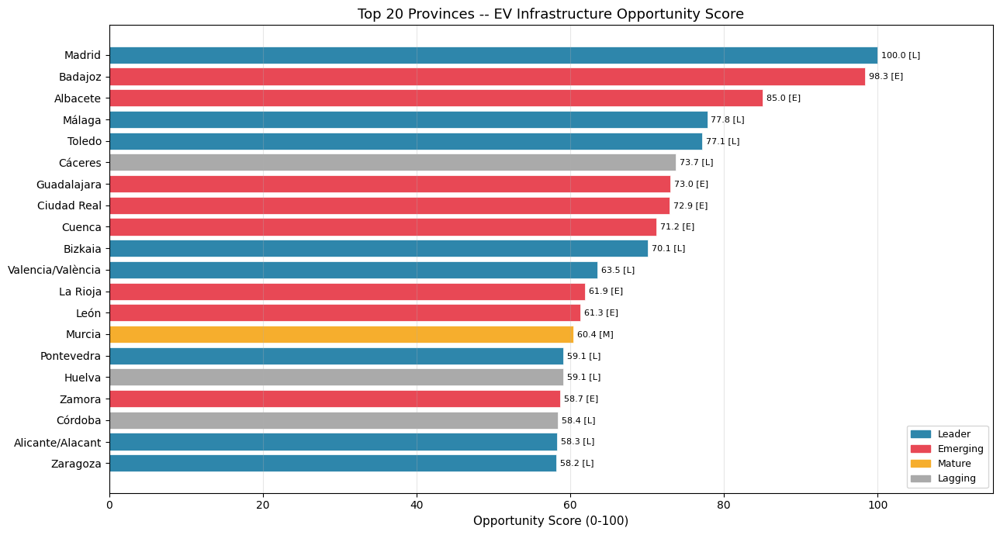

Saved: c:\Users\steve\OneDrive - IE University\Term 2\DATATHON_2\Iberdrola\SpanishElecticGrid\notebooks\outputs\emerging_markets_scores.png


In [24]:
fig, ax = plt.subplots(figsize=(13, 7))

colors_bar = [Q_COLORS[q] for q in top20['quadrant']]
bars = ax.barh(top20['province_name'][::-1], top20['opportunity_score'][::-1],
               color=colors_bar[::-1], edgecolor='white', linewidth=0.5)

for bar, (_, row) in zip(bars, top20[::-1].iterrows()):
    ax.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
            f"{row['opportunity_score']:.1f} [{row['quadrant'][0]}]",
            va='center', fontsize=8)

patches = [mpatches.Patch(color=v, label=k) for k, v in Q_COLORS.items()]
ax.legend(handles=patches, loc='lower right', fontsize=9)
ax.set_xlabel('Opportunity Score (0-100)', fontsize=11)
ax.set_title('Top 20 Provinces -- EV Infrastructure Opportunity Score', fontsize=13)
ax.set_xlim(0, 115)
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()

out_path = os.path.join(OUTPUTS_DIR, 'emerging_markets_scores.png')
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {out_path}')


## 11. CAGR by Autonomous Community

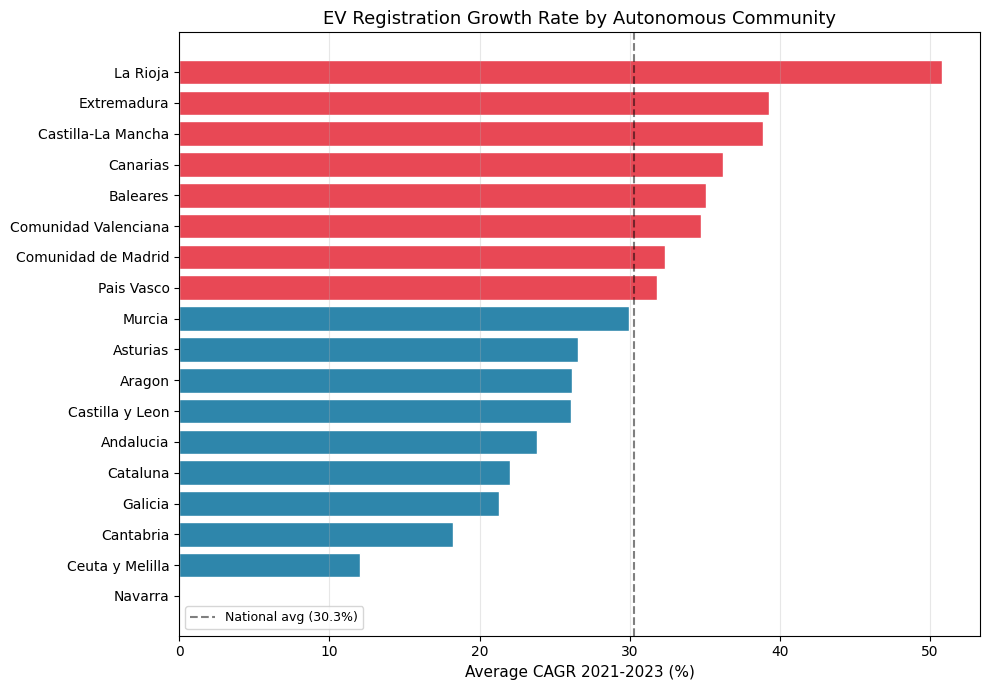

Saved: c:\Users\steve\OneDrive - IE University\Term 2\DATATHON_2\Iberdrola\SpanishElecticGrid\notebooks\outputs\emerging_markets_cagr_ac.png


In [25]:
ac_cagr = analysis.groupby('auto_community')['cagr'].mean().sort_values(ascending=False)
ac_cagr = ac_cagr[ac_cagr.index != 'Other']

fig, ax = plt.subplots(figsize=(10, 7))
colors_bar2 = ['#E84855' if v >= national_cagr else '#2E86AB' for v in ac_cagr.values]
ax.barh(ac_cagr.index[::-1], (ac_cagr.values * 100)[::-1],
        color=colors_bar2[::-1], edgecolor='white')
ax.axvline(national_cagr * 100, ls='--', lw=1.5, color='black', alpha=0.5,
           label=f'National avg ({national_cagr:.1%})')
ax.set_xlabel('Average CAGR 2021-2023 (%)', fontsize=11)
ax.set_title('EV Registration Growth Rate by Autonomous Community', fontsize=13)
ax.legend(fontsize=9)
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()

out_path = os.path.join(OUTPUTS_DIR, 'emerging_markets_cagr_ac.png')
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {out_path}')


## 12. Output -- emerging_markets_ranking.csv

In [26]:
output_cols = [
    'province_code', 'province_name', 'auto_community',
    'ev_fleet_2027', 'cagr', 'quadrant', 'opportunity_score',
    'reg_base', 'reg_end'
]

out_df = analysis[output_cols].sort_values('opportunity_score', ascending=False).copy()
out_df['cagr'] = out_df['cagr'].round(4)

out_path = os.path.join(OUTPUTS_DIR, 'emerging_markets_ranking.csv')
out_df.to_csv(out_path, index=False)
print(f'Saved {len(out_df)} rows to: {out_path}')
print()
emerging = out_df[out_df['quadrant'] == 'Emerging'].head(10)
if len(emerging):
    print('Top Emerging Markets for Iberdrola EV Infrastructure:')
    print(emerging[['province_code','province_name','cagr','ev_fleet_2027','opportunity_score']].to_string(index=False))
else:
    print('No Emerging provinces found -- check CAGR threshold')
    print('Top 10 by score:')
    print(out_df.head(10)[['province_code','province_name','quadrant','cagr','ev_fleet_2027','opportunity_score']].to_string(index=False))


Saved 52 rows to: c:\Users\steve\OneDrive - IE University\Term 2\DATATHON_2\Iberdrola\SpanishElecticGrid\notebooks\outputs\emerging_markets_ranking.csv

Top Emerging Markets for Iberdrola EV Infrastructure:
province_code province_name   cagr  ev_fleet_2027  opportunity_score
           BA       Badajoz 0.4981           6045               98.3
           AB      Albacete 0.4694           6511               85.0
           GU   Guadalajara 0.3664           4730               73.0
           CR   Ciudad Real 0.3663           4306               72.9
           CU        Cuenca 0.3535           2071               71.2
           LO      La Rioja 0.5078           4789               61.9
           LE          León 0.3806           5135               61.3
           ZA        Zamora 0.3608           1420               58.7
           LU          Lugo 0.3191           4833               56.7
           SA     Salamanca 0.3118           4043               53.3


# 13. Strategic Summary & Iberdrola Investment Proposals

---

## What We Did

We analysed **52 Spanish provinces** using three years of DGT vehicle registration data (2021-2023) to identify where Iberdrola should build interurban EV charging infrastructure by 2027.

### Methodology
| Step | What | Why |
|------|------|-----|
| **CAGR (2021-2023)** | 2-year compound annual growth rate of EV registrations per province | Measures market momentum; avoids COVID-distorted 2020 baseline |
| **Fleet 2027 projection** | From Notebook 2.2 (SARIMA + province share model) | Forward-looking demand, not just current stock |
| **Quadrant analysis** | Fleet size vs CAGR, split at national medians | Classifies each province into a strategic role |
| **Opportunity score** | CAGR (40%) + Fleet 2027 (35%) + Infrastructure gap/ICCT (25%) | Composite ranking that rewards growth AND under-served markets |

### Key Findings
- **National CAGR average: 30.3%** -- Spain's EV market is growing fast everywhere
- **Madrid dominates** in absolute fleet (636k EVs, 45% of Spain), but is already well-served
- **Castilla-La Mancha, Extremadura and La Rioja** are the fastest-growing regions that still lack charging infrastructure
- **Infrastructure gap** (chargers per 100 EVs) is largest in Extremadura (3.2), Castilla-La Mancha (3.9), and Andalucia (4.1)

---

## Proposal 1 -- Balanced Portfolio (Recommended)
> *Defend the large markets, grow with the emerging ones*

This strategy spreads risk across all quadrants. Iberdrola captures revenue from high-traffic Leader markets while securing first-mover advantage in Emerging markets before competitors arrive.

### Phase 1 -- Defend Leaders (immediate, high revenue)
Large EV fleets + strong growth. High charger utilisation from day one.

| Province | Code | EV Fleet 2027 | CAGR | Priority corridor |
|----------|------|--------------|------|-------------------|
| Madrid | M | 636,000 | 32.3% | A-1, A-2, A-3, A-4, A-5, A-6 |
| Barcelona | B | 184,000 | 21.2% | AP-7, A-2 |
| Valencia | V | 56,000 | 38.0% | A-3, AP-7 |
| Bizkaia | BI | 23,000 | 55.8% | A-8 |
| Malaga | MA | 32,000 | 39.8% | A-45, A-92 |

### Phase 2 -- Capture Emerging Markets (12-24 months, high strategic value)
Fast-growing provinces with very low current infrastructure. The low-competition window is closing.

| Province | Code | CAGR | Opportunity Score | Key corridor |
|----------|------|------|------------------|---------|
| Badajoz | BA | 49.8% | 98.3 | A-66 |
| Albacete | AB | 46.9% | 85.0 | A-4, A-31 |
| Guadalajara | GU | 36.6% | 73.0 | A-2 |
| Ciudad Real | CR | 36.6% | 72.9 | A-4 |
| La Rioja | LO | 50.8% | 61.9 | A-68 |
| Leon | LE | 38.1% | 61.3 | A-66, A-6 |

### Phase 3 -- Optimise Mature Markets (ongoing)
Large fleets but slower growth. Focus on upgrading to 150kW+ and adding peak-hour capacity.

| Province | Code | EV Fleet 2027 | Strategy |
|----------|------|--------------|---------|
| Sevilla | SE | 22,554 | Upgrade legacy chargers on A-4, A-92 |
| Murcia | MU | 19,404 | Expand A-30/A-7 coverage |
| Zaragoza | Z | ~15,000 | A-2 throughput corridor |

**Expected outcome:** Iberdrola captures ~68% of Spain's total addressable EV fleet across all corridors, balanced between immediate revenue and long-term growth.

---

## Proposal 2 -- Emerging Markets First (Bold / Differentiated)
> *Go where no one else has gone yet*

Higher risk, higher reward. Iberdrola focuses exclusively on under-served, fast-growing provinces where competitors have not yet built. If EV growth materialises as projected, Iberdrola becomes the dominant operator in these markets with a locked-in network effect.

### Target Provinces (ranked by opportunity score)

| Rank | Province | Code | CAGR | EV Fleet 2027 | Score | Corridor |
|------|----------|------|------|--------------|-------|---------|
| 1 | Badajoz | BA | 49.8% | 6,045 | 98.3 | A-66 |
| 2 | Albacete | AB | 46.9% | 6,511 | 85.0 | A-4, A-31 |
| 3 | Guadalajara | GU | 36.6% | 4,730 | 73.0 | A-2 |
| 4 | Ciudad Real | CR | 36.6% | 4,306 | 72.9 | A-4 |
| 5 | Cuenca | CU | 35.4% | 2,071 | 71.2 | A-3 |
| 6 | La Rioja | LO | 50.8% | 4,789 | 61.9 | A-68 |
| 7 | Leon | LE | 38.1% | 5,135 | 61.3 | A-66, A-6 |
| 8 | Zamora | ZA | 36.1% | 1,420 | 58.7 | A-66 |
| 9 | Lugo | LU | 31.9% | 4,833 | 56.7 | A-6 |
| 10 | Salamanca | SA | 31.2% | 4,043 | 53.3 | A-66, A-62 |

### Why this is strategically compelling
1. **Biggest infrastructure gap** -- Extremadura has only 3.2 chargers per 100 EVs vs 8.2 in Madrid. Early movers define the market.
2. **Corridor alignment** -- Most of these provinces sit on the **A-66 (Silver Route)** and **A-4 (Andalucia corridor)**, two of Spain's busiest interurban routes. Every EV driving Madrid-Sevilla passes through them.
3. **Lower competition** -- Madrid and Barcelona are already contested by Repsol, Endesa X, and BP Pulse. These markets are not.
4. **Compounding loyalty** -- A driver who charges in Badajoz once will return. Brand loyalty compounds before competitors arrive.

### Risk factors
- Current EV fleet is small (1,400-6,500 per province) -- charger utilisation will be low in early years
- CAGR projections assume national EV adoption trend continues; policy slowdown hits emerging markets hardest
- Grid capacity in rural A-66/A-4 segments may require distributor upgrades (pending colleague task 1.3)

---

## Decision Matrix

| | Proposal 1 (Balanced) | Proposal 2 (Emerging-first) |
|---|---|---|
| **Revenue certainty** | High | Low-Medium (early years) |
| **Competitive moat** | Medium | High |
| **Stations required** | 38 across all corridors | ~15-20 focused stations |
| **Risk level** | Low | Medium-High |
| **Differentiation vs competitors** | Standard | Strong |
| **Best if...** | Iberdrola wants stable ROI | Iberdrola wants to dominate by 2030 |

**Pitch recommendation:** Lead with **Proposal 1** as the base case (safe, revenue-backed), then present **Proposal 2** as the bold-bet scenario. The optimal real-world answer is a hybrid -- anchor stations in Madrid and Barcelona for immediate cash flow, while racing to plant flags in Badajoz, La Rioja and the A-66 corridor before Repsol or Endesa X get there.
